In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [2]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate


class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False,
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()

        self.net = []
        self.net.append(SineLayer(in_features, hidden_features,
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features,
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0,
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)

            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features,
                                      is_first=False, omega_0=hidden_omega_0))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [3]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [4]:
#change this is to my image
def get_image_tensor(sidelength):
    img = Image.open('/home/zmanita/AdobeStock_1229543951_Preview.jpeg')
    transform = Compose([
        # Resize to a square (sidelength, sidelength) to match the coordinate grid
        Resize((sidelength, sidelength)),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [5]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_image_tensor(sidelength)
        # Use reshape instead of view to handle non-contiguous tensors
        # img shape: (C, H, W) -> permute to (H, W, C) -> reshape to (H*W, C)
        self.pixels = img.permute(1, 2, 0).reshape(-1, img.shape[0])
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixels

In [6]:
cameraman = ImageFitting(1024)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=3, hidden_features=1024,
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

/home/zmanita/.conda/envs/manita/lib/python3.11/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=1024, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=1024, out_features=1024, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=1024, out_features=1024, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=1024, out_features=1024, bias=True)
    )
    (4): Linear(in_features=1024, out_features=3, bias=True)
  )
)

/tmp/ipykernel_2590559/1619938472.py:14: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  print("Step %d, Total loss %0.6f" % (step, loss))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12053765..0.13184729].


Step 0, Total loss 0.284837


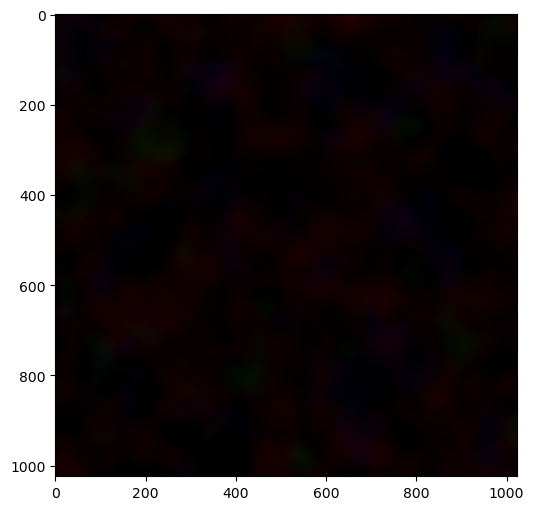

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.72943354..0.92664874].


Step 10, Total loss 0.030625


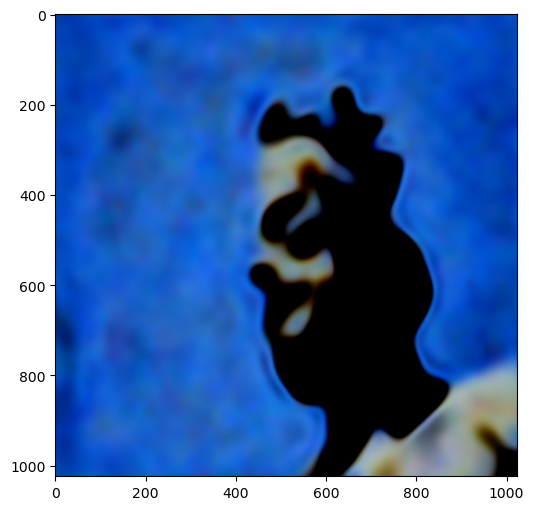

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92135316..0.95466506].


Step 20, Total loss 0.016078


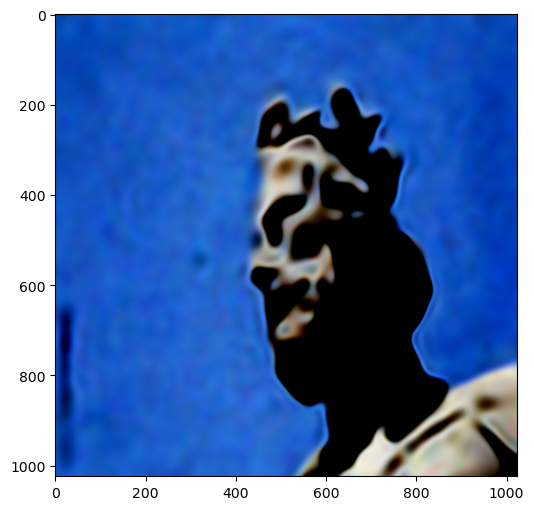

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97030866..1.0045748].


Step 30, Total loss 0.011274


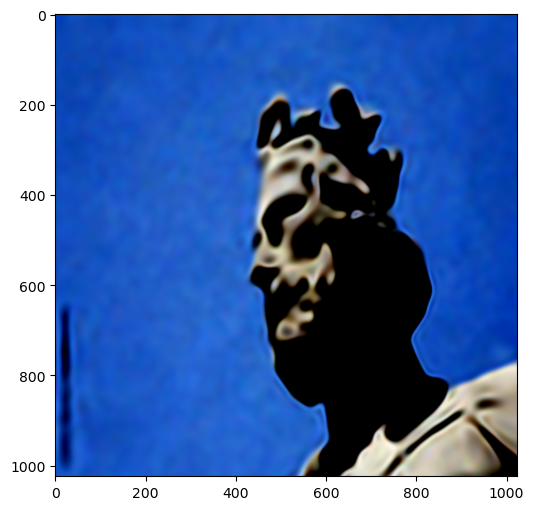

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0312588..1.0405927].


Step 40, Total loss 0.008965


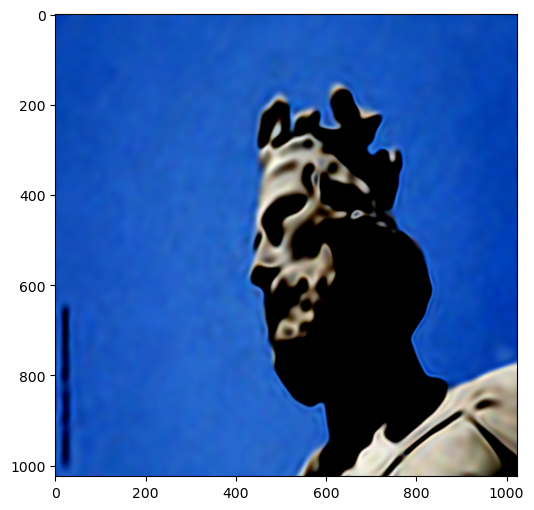

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0280527..1.0341457].


Step 50, Total loss 0.007744


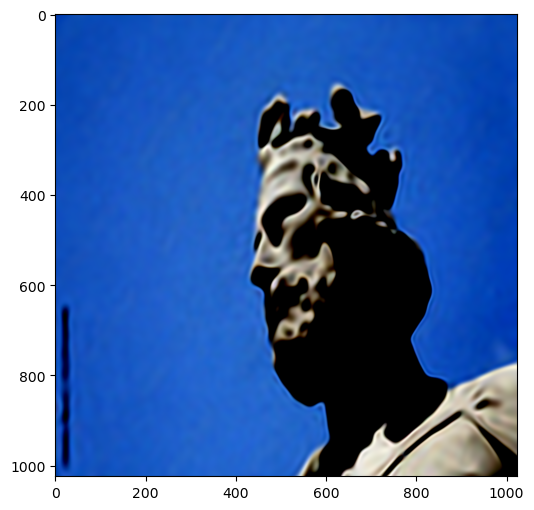

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0421627..1.0621235].


Step 60, Total loss 0.006944


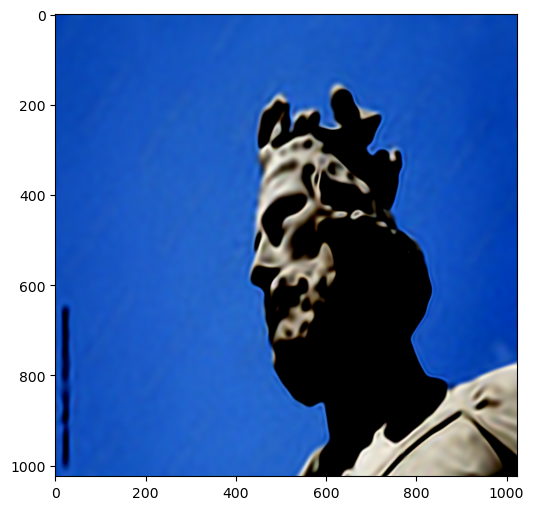

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0521057..1.0692666].


Step 70, Total loss 0.006358


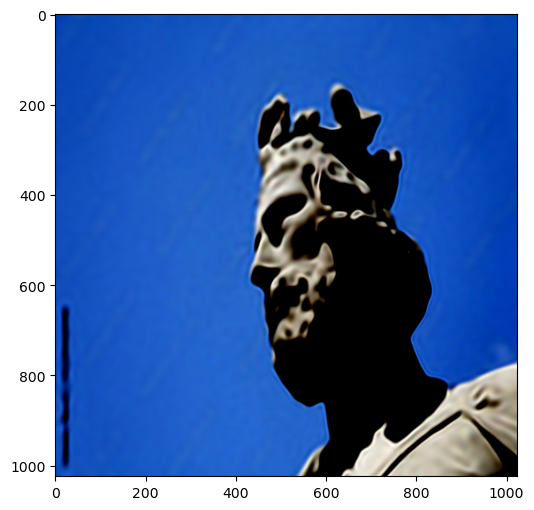

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0457258..1.0669765].


Step 80, Total loss 0.006174


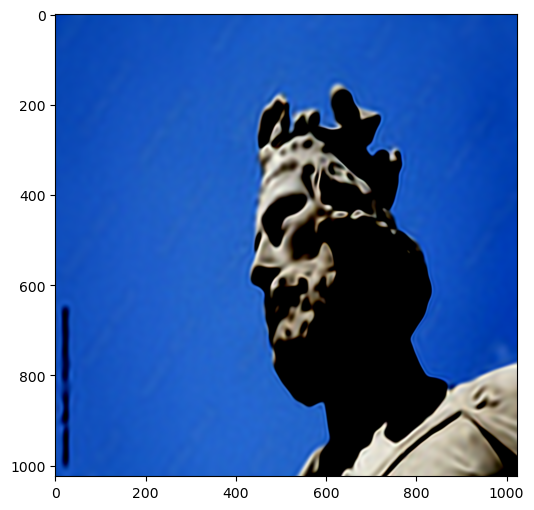

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.043757..1.0496464].


Step 90, Total loss 0.005613


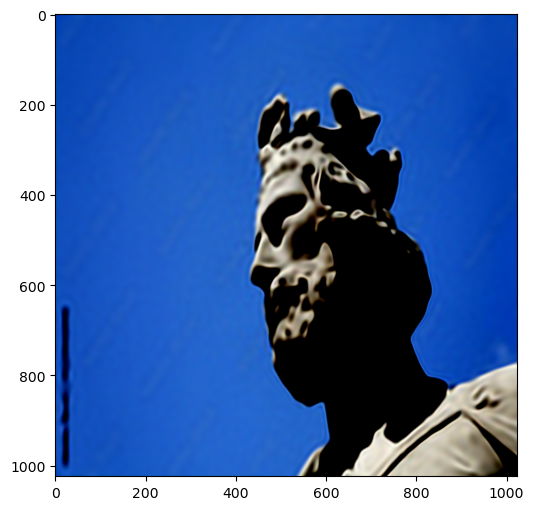

In [7]:
total_steps = 100
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        
        # Only visualize the output, skip gradient computations
        fig, axes = plt.subplots(1,1, figsize=(6,6))
        axes.imshow(model_output.cpu().view(1024,1024,3).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

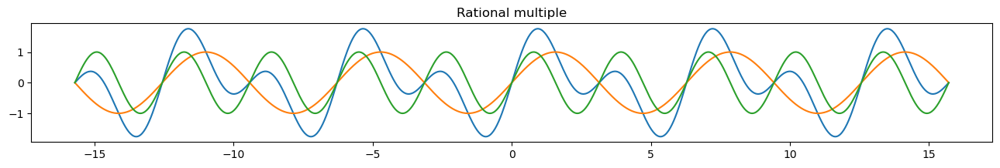

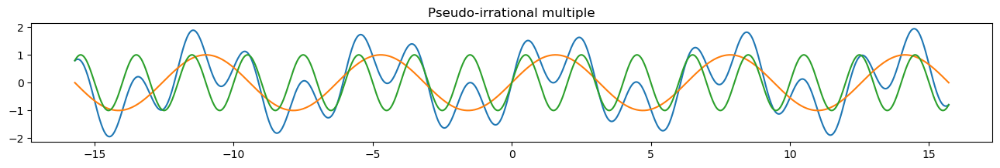

In [8]:
with torch.no_grad():
    coords = get_mgrid(2**10, 1) * 5 * np.pi
    
    sin_1 = torch.sin(coords)
    sin_2 = torch.sin(coords * 2)
    sum = sin_1 + sin_2
    
    fig, ax = plt.subplots(figsize=(16,2))
    ax.plot(coords, sum)
    ax.plot(coords, sin_1)
    ax.plot(coords, sin_2)
    plt.title("Rational multiple")
    plt.show()
    
    sin_1 = torch.sin(coords)
    sin_2 = torch.sin(coords * np.pi)
    sum = sin_1 + sin_2
    
    fig, ax = plt.subplots(figsize=(16,2))
    ax.plot(coords, sum)
    ax.plot(coords, sin_1)
    ax.plot(coords, sin_2)
    plt.title("Pseudo-irrational multiple")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.958385..0.9937855].


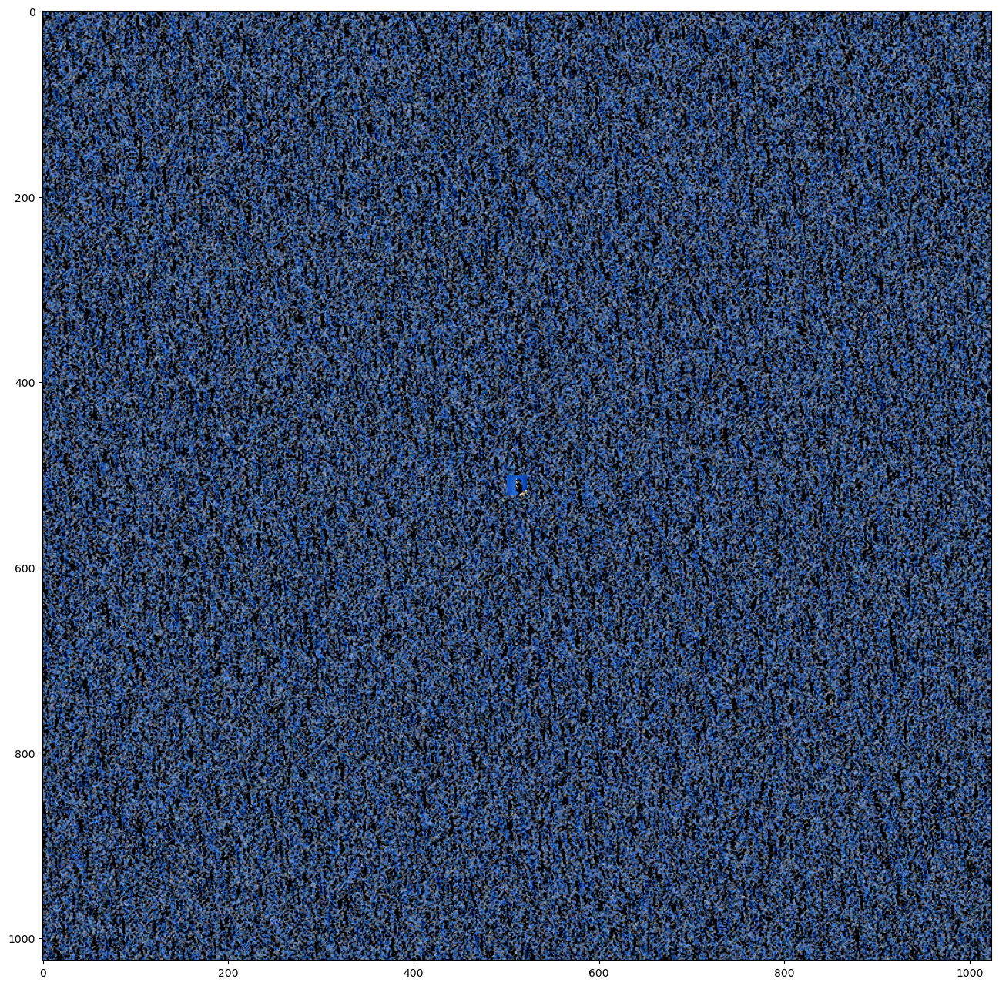

In [9]:
with torch.no_grad():
    out_of_range_coords = get_mgrid(1024, 2) * 50
    model_out, _ = img_siren(out_of_range_coords.cuda())
    
    fig, ax = plt.subplots(figsize=(16,16))
    # For RGB image, reshape to (1024, 1024, 3)
    ax.imshow(model_out.cpu().view(1024, 1024, 3).numpy())
    plt.show()

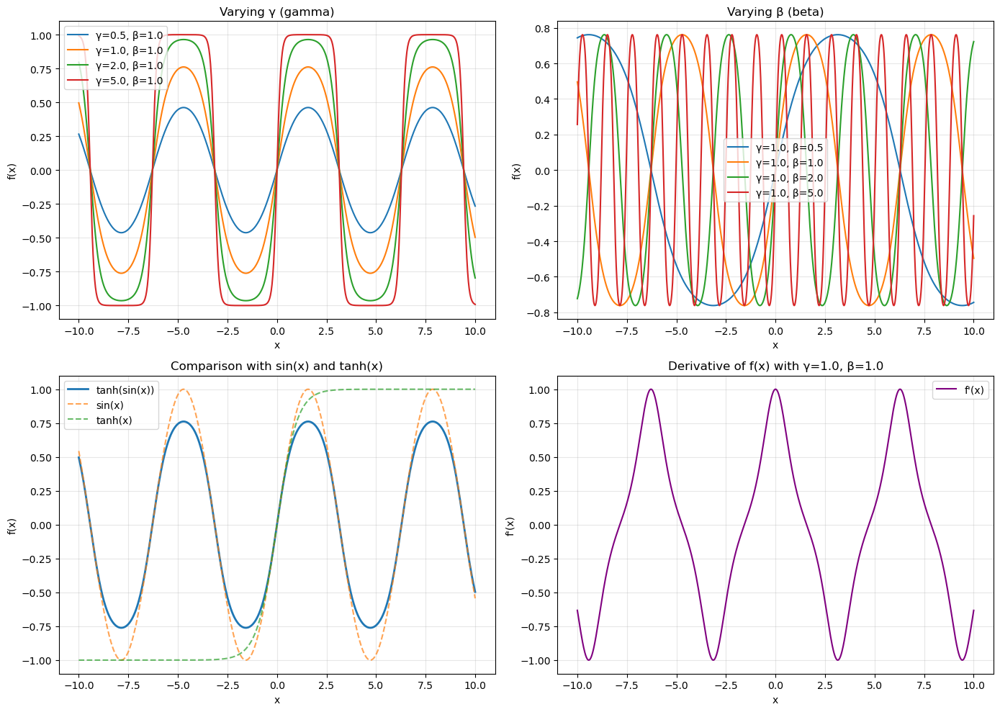

In [10]:
import torch
from torch import nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# ========== 1. Visualize the Custom Activation Function ==========
def custom_activation(x, gamma=1.0, beta=1.0):
    """
    Custom activation: f(x) = tanh(gamma * sin(beta * x))
    """
    return torch.tanh(gamma * torch.sin(beta * x))

# Plot the activation function with different parameters
x = torch.linspace(-10, 10, 1000)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Varying gamma
ax = axes[0, 0]
for gamma in [0.5, 1.0, 2.0, 5.0]:
    y = custom_activation(x, gamma=gamma, beta=1.0)
    ax.plot(x.numpy(), y.numpy(), label=f'γ={gamma}, β=1.0')
ax.set_title('Varying γ (gamma)')
ax.set_xlabel('x')
ax.set_ylabel('f(x)')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot 2: Varying beta
ax = axes[0, 1]
for beta in [0.5, 1.0, 2.0, 5.0]:
    y = custom_activation(x, gamma=1.0, beta=beta)
    ax.plot(x.numpy(), y.numpy(), label=f'γ=1.0, β={beta}')
ax.set_title('Varying β (beta)')
ax.set_xlabel('x')
ax.set_ylabel('f(x)')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot 3: Compare with sine and tanh
ax = axes[1, 0]
y_custom = custom_activation(x, gamma=1.0, beta=1.0)
y_sin = torch.sin(x)
y_tanh = torch.tanh(x)
ax.plot(x.numpy(), y_custom.numpy(), label='tanh(sin(x))', linewidth=2)
ax.plot(x.numpy(), y_sin.numpy(), label='sin(x)', linestyle='--', alpha=0.7)
ax.plot(x.numpy(), y_tanh.numpy(), label='tanh(x)', linestyle='--', alpha=0.7)
ax.set_title('Comparison with sin(x) and tanh(x)')
ax.set_xlabel('x')
ax.set_ylabel('f(x)')
ax.grid(True, alpha=0.3)
ax.legend()

# Plot 4: Derivative (gradient)
ax = axes[1, 1]
x_grad = x.clone().requires_grad_(True)
y_grad = custom_activation(x_grad, gamma=1.0, beta=1.0)
grad = torch.autograd.grad(y_grad.sum(), x_grad)[0]
ax.plot(x.numpy(), grad.numpy(), label="f'(x)", color='purple')
ax.set_title('Derivative of f(x) with γ=1.0, β=1.0')
ax.set_xlabel('x')
ax.set_ylabel("f'(x)")
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()

In [11]:
# ========== 2. Custom Layer Implementation ==========
class CustomActivationLayer(nn.Module):
    """
    Layer with custom activation: f(x) = tanh(gamma * sin(beta * x))
    """
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, gamma=1.0, beta=30.0):
        super().__init__()
        self.gamma = gamma
        self.beta = beta
        self.is_first = is_first
        self.in_features = in_features
        
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                           1 / self.in_features)
            else:
                # Similar initialization to SIREN but adapted for our activation
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.beta,
                                           np.sqrt(6 / self.in_features) / self.beta)
    
    def forward(self, input):
        return torch.tanh(self.gamma * torch.sin(self.beta * self.linear(input)))
    
    def forward_with_intermediate(self, input):
        intermediate = self.beta * self.linear(input)
        return torch.tanh(self.gamma * torch.sin(intermediate)), intermediate


class CustomSiren(nn.Module):
    """
    SIREN-like network with custom tanh(gamma*sin(beta*x)) activation
    """
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, 
                 outermost_linear=False, first_gamma=1.0, first_beta=30.0,
                 hidden_gamma=1.0, hidden_beta=30.0):
        super().__init__()
        
        self.net = []
        self.net.append(CustomActivationLayer(in_features, hidden_features,
                                             is_first=True, gamma=first_gamma, 
                                             beta=first_beta))
        
        for i in range(hidden_layers):
            self.net.append(CustomActivationLayer(hidden_features, hidden_features,
                                                 is_first=False, gamma=hidden_gamma,
                                                 beta=hidden_beta))
        
        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_beta,
                                            np.sqrt(6 / hidden_features) / hidden_beta)
            self.net.append(final_linear)
        else:
            self.net.append(CustomActivationLayer(hidden_features, out_features,
                                                 is_first=False, gamma=hidden_gamma,
                                                 beta=hidden_beta))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)
        output = self.net(coords)
        return output, coords


Training Custom SIREN with tanh(γ*sin(β*x)) activation

Starting training...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0383472..0.08374047].


Step 0, Total loss 0.272832


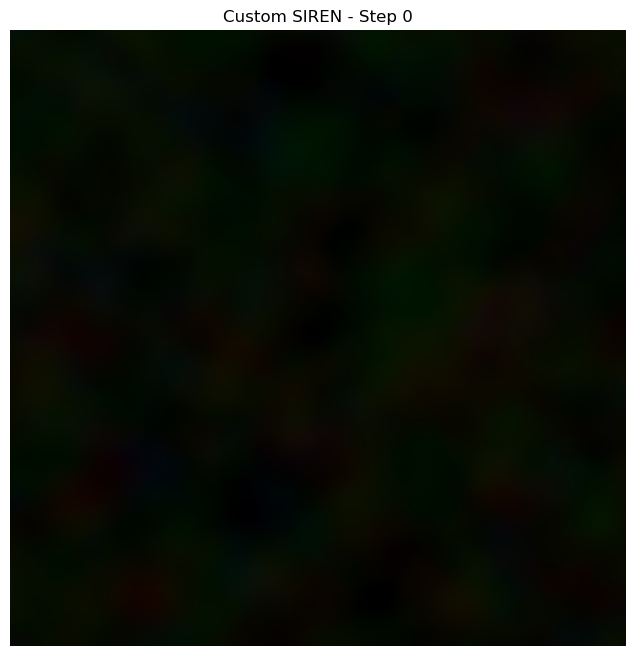

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6014246..0.92480266].


Step 10, Total loss 0.039337


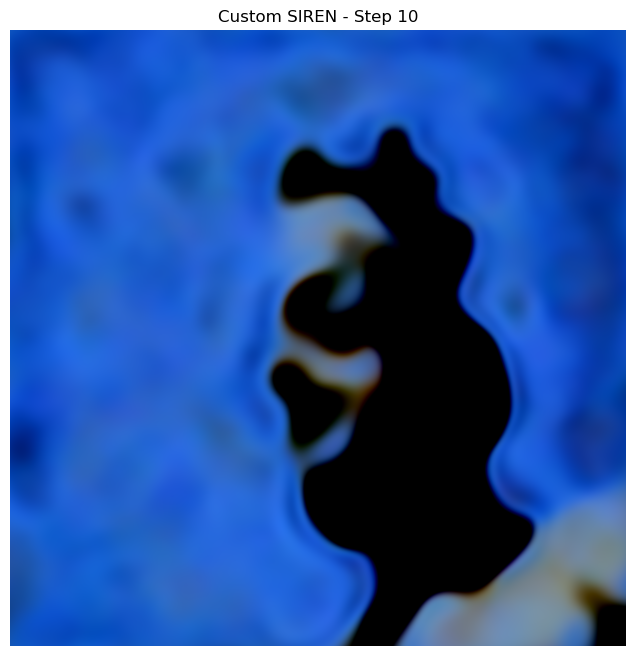

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8483125..0.9431946].


Step 20, Total loss 0.020957


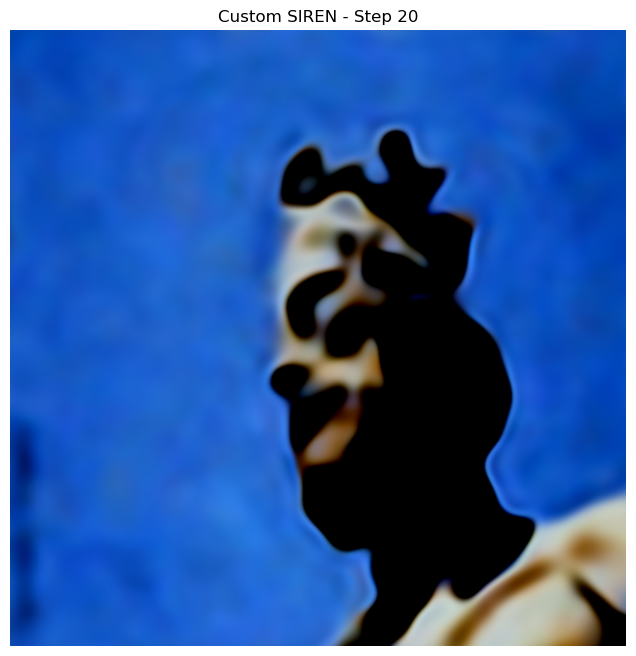

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.89605343..0.9359336].


Step 30, Total loss 0.014114


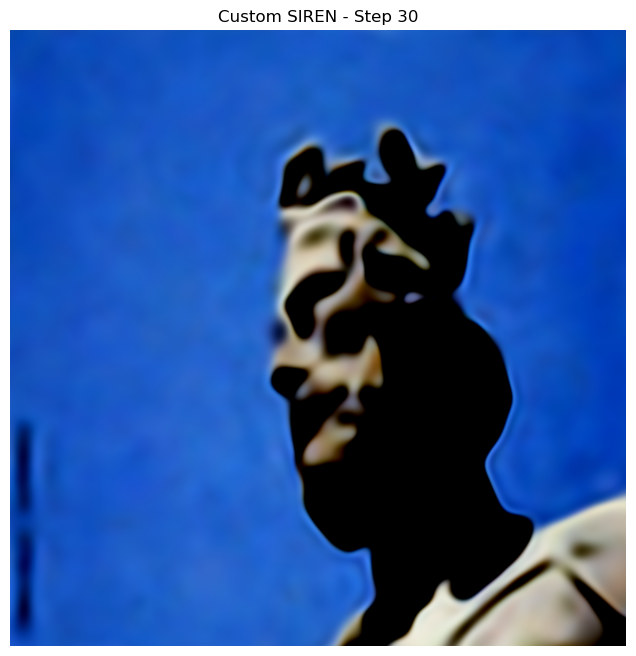

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92931205..0.97550046].


Step 40, Total loss 0.010694


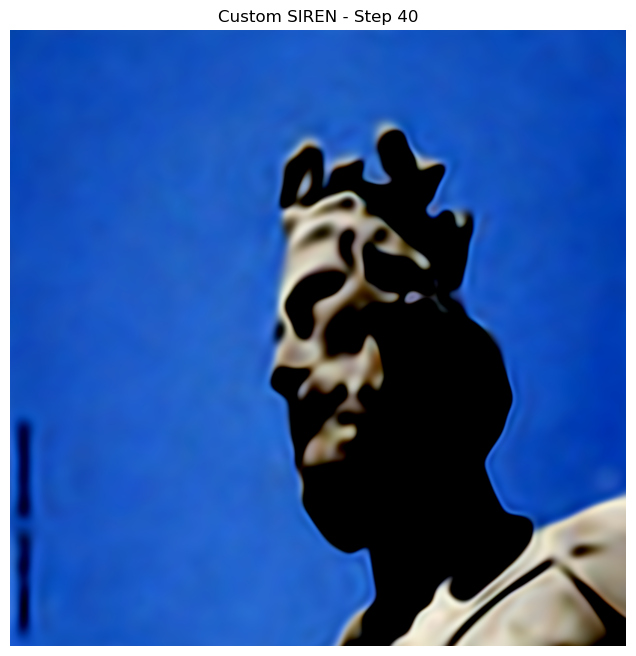

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95674855..0.9871558].


Step 50, Total loss 0.009071


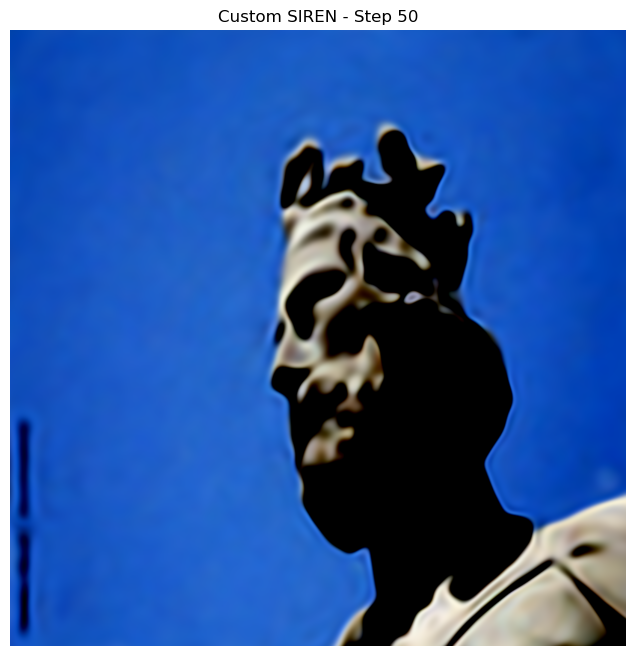

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.96496195..0.9920591].


Step 60, Total loss 0.008074


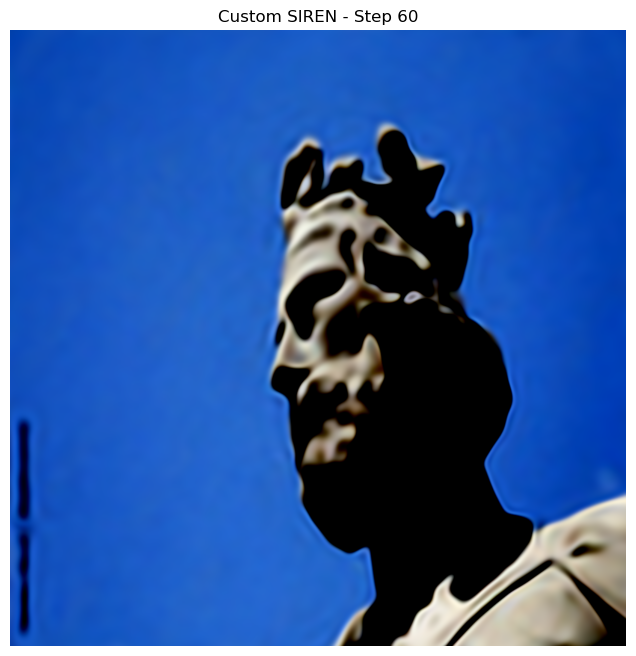

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9749588..0.9967586].


Step 70, Total loss 0.007436


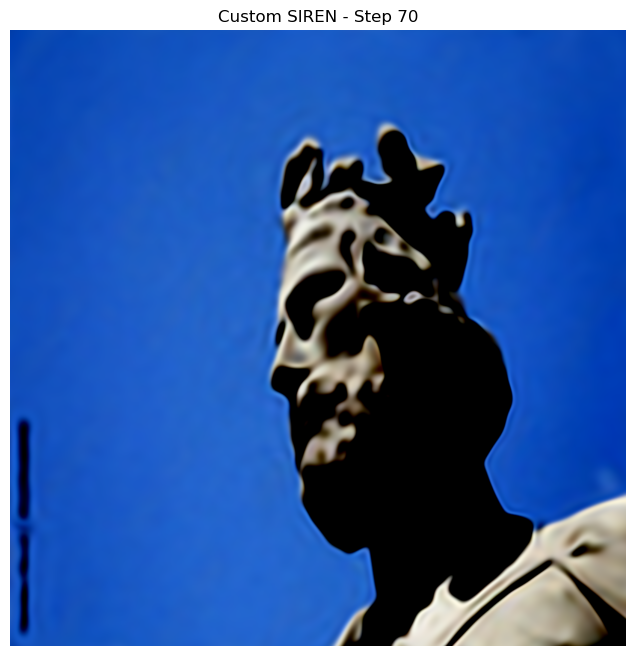

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9809177..1.0140063].


Step 80, Total loss 0.006811


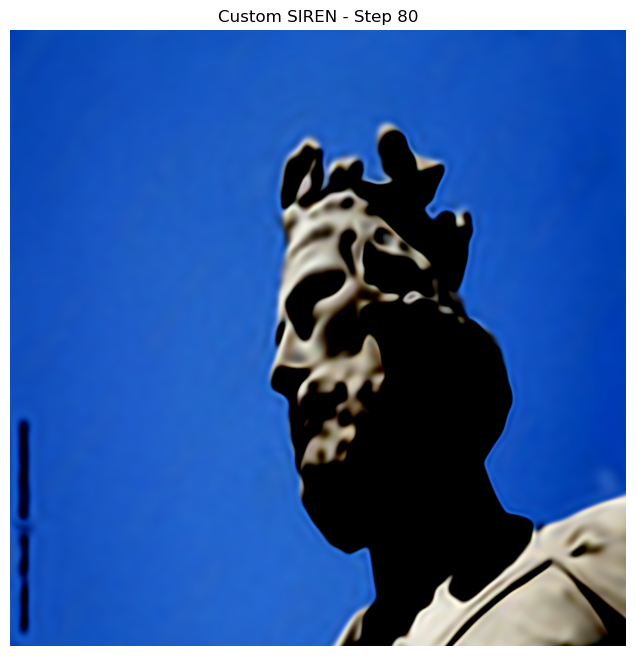

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9835984..1.0245922].


Step 90, Total loss 0.006435


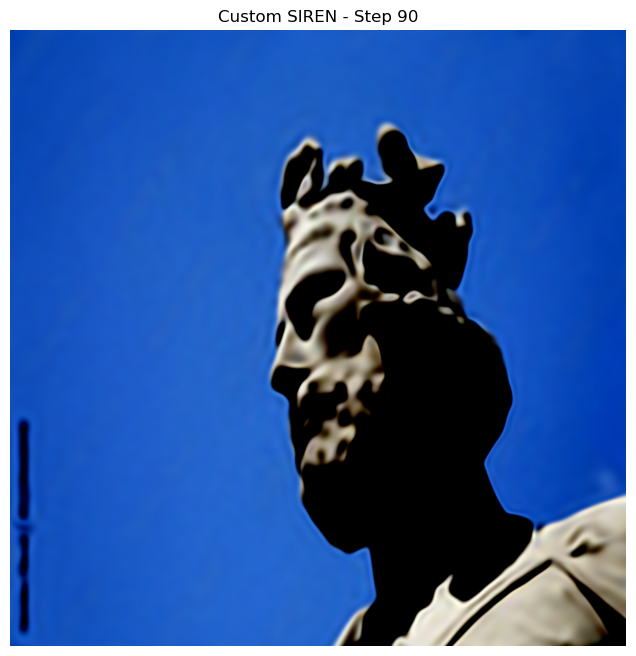


Training complete!


In [12]:
# ========== 3. Training Code ==========
print("=" * 60)
print("Training Custom SIREN with tanh(γ*sin(β*x)) activation")
print("=" * 60)

# Assuming you have the ImageFitting class and get_mgrid function defined
# from your original code

from torch.utils.data import DataLoader

# Create dataset and dataloader
cameraman = ImageFitting(1024)  # Your existing ImageFitting class
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

# Initialize custom SIREN model
img_custom_siren = CustomSiren(
    in_features=2, 
    out_features=3, 
    hidden_features=1024,
    hidden_layers=3, 
    outermost_linear=True,
    first_gamma=1.0,
    first_beta=30.0,
    hidden_gamma=1.0,
    hidden_beta=30.0
)
img_custom_siren.cuda()

# Training parameters
total_steps = 100
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_custom_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

print("\nStarting training...")
for step in range(total_steps):
    model_output, coords = img_custom_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print(f"Step {step}, Total loss {loss.item():.6f}")
        
        fig, axes = plt.subplots(1, 1, figsize=(8, 8))
        axes.imshow(model_output.cpu().view(1024, 1024, 3).detach().numpy())
        axes.set_title(f'Custom SIREN - Step {step}')
        axes.axis('off')
        plt.show()
    
    optim.zero_grad()
    loss.backward()
    optim.step()

print("\nTraining complete!")


Testing out-of-range generalization


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.90795434..0.9442091].


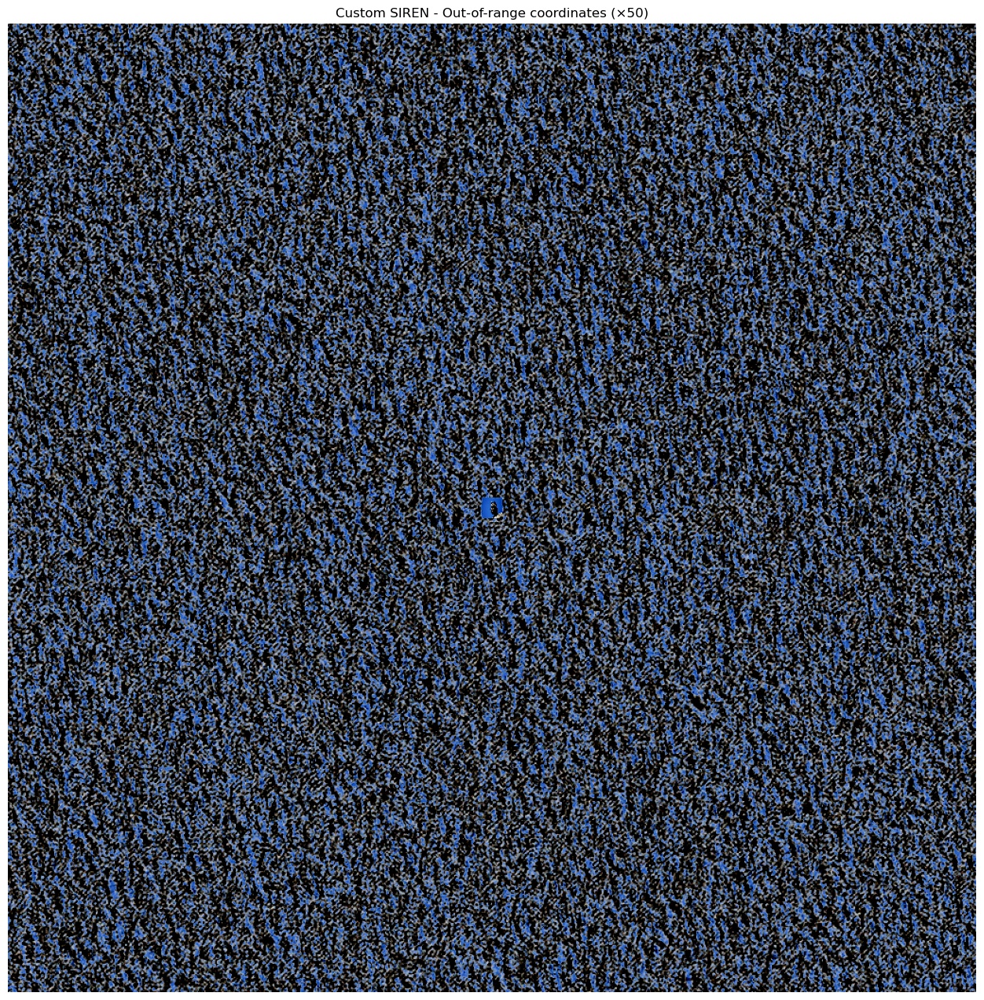

In [13]:
# ========== 4. Test Out-of-Range Generalization ==========
print("\n" + "=" * 60)
print("Testing out-of-range generalization")
print("=" * 60)

with torch.no_grad():
    out_of_range_coords = get_mgrid(1024, 2) * 50
    model_out, _ = img_custom_siren(out_of_range_coords.cuda())
    
    fig, ax = plt.subplots(figsize=(16, 16))
    ax.imshow(model_out.cpu().view(1024, 1024, 3).numpy())
    ax.set_title('Custom SIREN - Out-of-range coordinates (×50)')
    ax.axis('off')
    plt.show()



Side-by-side comparison


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0452514..1.0741317].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9837727..1.0305845].


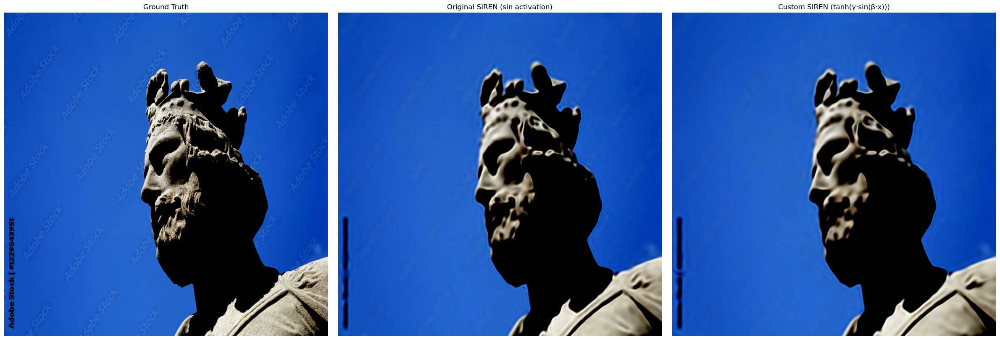


Experiment complete!


In [15]:
# ========== 5. Compare Original SIREN vs Custom SIREN ==========
print("\n" + "=" * 60)
print("Side-by-side comparison")
print("=" * 60)

# Use the already trained original SIREN from your earlier code
# Assuming img_siren is already trained and available

# Final comparison
with torch.no_grad():
    test_coords = get_mgrid(1024, 2).cuda()
    
    custom_out, _ = img_custom_siren(test_coords)
    original_out, _ = img_siren(test_coords)  # Use your already trained model
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))
    
    axes[0].imshow(ground_truth.cpu().view(1024, 1024, 3).numpy())
    axes[0].set_title('Ground Truth')
    axes[0].axis('off')
    
    axes[1].imshow(original_out.cpu().view(1024, 1024, 3).numpy())
    axes[1].set_title('Original SIREN (sin activation)')
    axes[1].axis('off')
    
    axes[2].imshow(custom_out.cpu().view(1024, 1024, 3).numpy())
    axes[2].set_title('Custom SIREN (tanh(γ·sin(β·x)))')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

print("\n" + "=" * 60)
print("Experiment complete!")
print("=" * 60)